# **Final Project**

In [1]:
#https://github.com/sgrvinod/a-PyTorch-Tutorial-to-Image-Captioning/blob/master/datasets.py

In [2]:
import numpy as np
from PIL import Image
import os
import string
from pickle import dump
from pickle import load

"""
from keras.applications.xception import Xception #to get pre-trained model Xception
from keras.applications.xception import preprocess_input
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.text import Tokenizer #for text tokenization
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from keras.layers.merge import add
from keras.models import Model, load_model
from keras.layers import Input, Dense#Keras to build our CNN and LSTM
from keras.layers import LSTM, Embedding, Dropout
"""

#from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array

import warnings
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import wrap
from tqdm.notebook import tqdm as Tqdm #to check loop progress
Tqdm().pandas()
import torch

#from torch_snippets import *
import json
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

# Now import the packagea
from torch_snippets import *
print("Torch Snippets Imported Successfully!")



0it [00:00, ?it/s]

cuda
Torch Snippets Imported Successfully!


# Flickr30k

In [3]:
from datasets import load_dataset

dataset_flickr30k = load_dataset("nlphuji/flickr30k")

In [4]:
dataset_flickr30k

DatasetDict({
    test: Dataset({
        features: ['image', 'caption', 'sentids', 'split', 'img_id', 'filename'],
        num_rows: 31014
    })
})

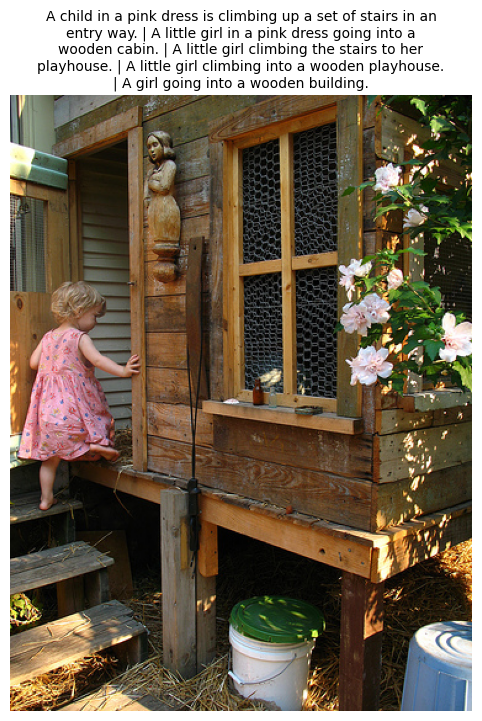

In [5]:
import matplotlib.pyplot as plt
from textwrap import wrap

# Select a sample from the dataset
sample = dataset_flickr30k['test'][2]
image = sample['image']
captions = sample['caption']

# Display the image with the captions
plt.figure(figsize=(8, 8))
plt.imshow(image)
plt.axis('off')  # Turn off axes
plt.title("\n".join(wrap(" | ".join(captions), 60)), fontsize=10)
plt.show()

In [6]:
# Split the dataset into train and test sets
train_test_split = dataset_flickr30k['test'].train_test_split(test_size=0.2)

# Further split the train set into train and validation sets
train_val_split = train_test_split['train'].train_test_split(test_size=0.2)

# Combine splits into a dictionary
dataset_flickr30k = {
    'train': train_val_split['train'],
    'validation': train_val_split['test'],
    'test': train_test_split['test']
}

del train_test_split, train_val_split

dataset_flickr30k

{'train': Dataset({
     features: ['image', 'caption', 'sentids', 'split', 'img_id', 'filename'],
     num_rows: 19848
 }),
 'validation': Dataset({
     features: ['image', 'caption', 'sentids', 'split', 'img_id', 'filename'],
     num_rows: 4963
 }),
 'test': Dataset({
     features: ['image', 'caption', 'sentids', 'split', 'img_id', 'filename'],
     num_rows: 6203
 })}

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.5527872..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0322802..2.6051416].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.622571].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0151556..2.6051416].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.6051416].
Clipp

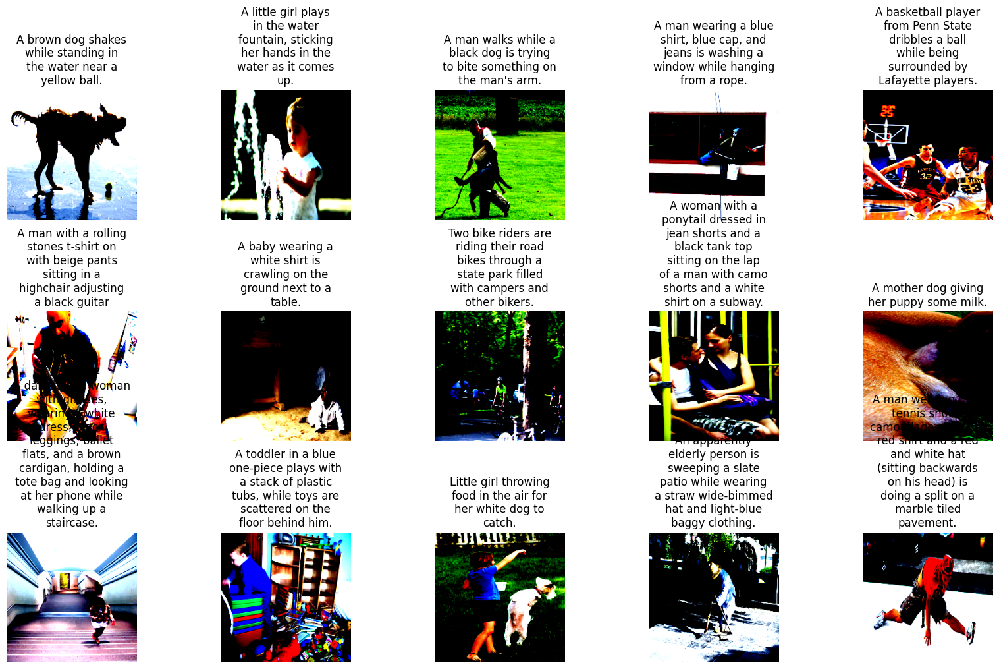

In [7]:
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
from textwrap import wrap
from datasets import load_dataset


# Function to read and process an image
def read_image(img_pil, img_size=224):
    """
    Reads and processes a PIL image for PyTorch models.
    Parameters:
    - img_pil: PIL Image object
    - img_size: int, size to resize the image to (img_size x img_size)
    Returns:
    - numpy array: Processed image ready for display
    """
    transform = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),  # Converts image to [0, 1] range
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize for pre-trained models
    ])
    img = transform(img_pil)
    return img.permute(1, 2, 0).numpy()  # Convert back to (H, W, C) for visualization

# Function to display a sample of images with captions
def display_images(dataset, split='train'):
    """
    Displays images and captions from a dataset split.
    Parameters:
    - dataset: dict, containing 'train', 'validation', 'test' splits
    - split: str, which dataset split to display ('train', 'validation', 'test')
    """
    subset = dataset[split]
    subset = subset.select(range(min(15, len(subset))))  # Select the first 15 samples
    plt.figure(figsize=(20, 20))
    
    for idx, data in enumerate(subset):
        plt.subplot(5, 5, idx + 1)
        plt.subplots_adjust(hspace=0.7, wspace=0.3)
        
        # Process image
        image = read_image(data['image'])
        
        # Plot image
        plt.imshow(image)
        plt.title("\n".join(wrap(data['caption'][0], 20)))  # Show the first caption
        plt.axis("off")
    plt.show()

# Display images from the training set
display_images(dataset_flickr30k, split='train')


In [8]:
dataset_flickr30k['train'][0]

{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x333>,
 'caption': ['A brown dog shakes while standing in the water near a yellow ball.',
  'The brown dog stands in the water and shakes off.',
  'A brown, wet dog shaking off the water.',
  'A dog on the beach shaking off water',
  'A dog shaking water off'],
 'sentids': ['54795', '54796', '54797', '54798', '54799'],
 'split': 'train',
 'img_id': '10959',
 'filename': '3111402233.jpg'}

In [ ]:
import string
from collections import Counter, defaultdict
import json
import re


class Vocab:
    def __init__(self, tokens=None, specials=None):
        """
        Initialize the vocabulary.
        
        Args:
            tokens (list of str): List of all tokens from the dataset.
            specials (list of str): List of special tokens to include in the vocabulary.
        """
        # Define special tokens
        self.specials = specials if specials else ["<unk>", "<pad>", "<start>", "<end>"]

        self.stoi = defaultdict(lambda: 0)  # Default to <unk> index
        self.itos = []

        if tokens:
            # Filter tokens to include only alphabetic words
            #tokens = [token for token in tokens if token.isalpha()]
            
            tokens = [re.sub(r'\W+', '', w) for w in tokens if len(w) > 1]  # Replace non-alphanumeric chars

            # Count frequency of tokens
            counter = Counter(tokens)
            counter.update(self.specials)

            # Assign index to each token
            self.itos = self.specials + [token for token, _ in counter.most_common() if token not in self.specials]
            self.stoi = defaultdict(lambda: self.stoi["<unk>"], {token: idx for idx, token in enumerate(self.itos)})

    def __len__(self):
        return len(self.itos)

    def __getitem__(self, key):
        """
        Access vocab using key (string for stoi, integer for itos).
        """
        if isinstance(key, str):
            return self.stoi[key]
        elif isinstance(key, int):
            return self.itos[key]
        else:
            raise TypeError("Key must be either str or int.")

    def save_to_json(self, filepath):
        """
        Save the vocabulary to a JSON file.
        
        Args:
            filepath (str): Path to the JSON file.
        """
        with open(filepath, 'w', encoding='utf-8') as f:
            json.dump({"itos": self.itos}, f, ensure_ascii=False, indent=4)

    @classmethod
    def load_from_json(cls, filepath):
        """
        Load a vocabulary from a JSON file.
        
        Args:
            filepath (str): Path to the JSON file.
        
        Returns:
            Vocab: A loaded Vocab instance.
        """
        with open(filepath, 'r', encoding='utf-8') as f:
            data = json.load(f)
        vocab = cls()
        vocab.itos = data["itos"]
        vocab.stoi = defaultdict(lambda: 0, {token: idx for idx, token in enumerate(vocab.itos)})
        return vocab


def tokenizer(text):
    return text.lower().split()  # Tokenizing by spaces and converting to lowercase


def clean_caption(caption_list):
    """
    Cleans a list of captions by:
    - Lowercasing words
    - Removing punctuation
    - Removing words with non-alphabetic characters or length <= 1
    """
    table = str.maketrans('', '', string.punctuation)
    cleaned_captions = []
    
    for caption in caption_list:
        words = caption.lower().split()  # Tokenize and lowercase
        words = [w.translate(table) for w in words]  # Remove punctuation
        words = [re.sub(r'\W+', '', w) for w in words if len(w) > 1]  # Replace non-alphanumeric chars
        cleaned_captions.append(' '.join(words))  # Rejoin words into cleaned caption
    return cleaned_captions


# Step 1: Combine all captions
all_captions = []
for split in ['train', 'validation', 'test']:
    all_captions.extend([caption for item in dataset_flickr30k[split] for caption in item['caption']])

# Step 2: Clean and tokenize captions
cleaned_captions = clean_caption(all_captions)
all_tokens = [token for caption in cleaned_captions for token in tokenizer(caption)]

# Step 3: Create vocabulary
vocab = Vocab(all_tokens)

# Save the vocabulary to a JSON file
vocab.save_to_json("vocab_attention.json")
print("Vocabulary saved to vocab.json")


# Load the vocabulary from a JSON file
vocab = Vocab.load_from_json("vocab_attention.json")
print("Loaded Vocabulary:", vocab.itos[:100])  # Check the first 10 tokens


Loaded Vocabulary: ['<unk>', '<pad>', '<start>', '<end>', 'in', 'the', 'on', 'and', 'man', 'is', 'of', 'with', 'woman', 'two', 'are', 'to', 'people', 'at', 'an', 'wearing', 'white', 'young', 'shirt', 'black', 'while', 'his', 'blue', 'red', 'sitting', 'men', 'girl', 'boy', 'standing', 'dog', 'playing', 'street', 'group', 'down', 'front', 'her', 'walking', 'holding', 'one', 'water', 'by', 'three', 'women', 'green', 'up', 'looking', 'as', 'child', 'for', 'large', 'outside', 'little', 'yellow', 'brown', 'person', 'children', 'through', 'from', 'hat', 'their', 'other', 'ball', 'small', 'next', 'into', 'over', 'some', 'dressed', 'out', 'building', 'jacket', 'running', 'another', 'riding', 'around', 'orange', 'near', 'field', 'crowd', 'stands', 'background', 'beach', 'pink', 'behind', 'sidewalk', 'table', 'jumping', 'sits', 'girls', 'grass', 'snow', 'bike', 'looks', 'that', 'top', 'camera']


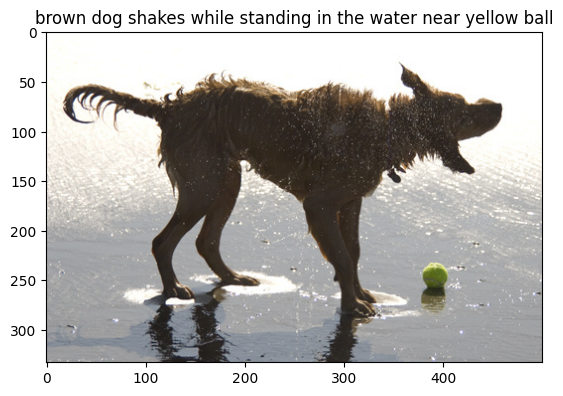

Caption: brown dog shakes while standing in the water near yellow ball
Target: tensor([   2,   57,   33, 1935,   24,   32,    4,    5,   43,   80,   56,   65,
           3])


In [10]:
from torchvision import transforms
from torch.utils.data import Dataset
import os
import torch
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image
from collections import defaultdict

class Flicker30kData(Dataset):
    def __init__(self, dataset, split='train', vocab=None, img_size=224):
        """
        Initializes the Captioning dataset.
        
        Parameters:
        - dataset: Hugging Face Dataset object (train, validation, or test)
        - split: str, dataset split to use ('train', 'validation', or 'test')
        - vocab: Vocabulary object
        - img_size: int, image size to resize
        """
        self.dataset = dataset[split]
        self.vocab = vocab
        self.split = split
        self.transform = transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.RandomCrop(img_size),
            transforms.RandomHorizontalFlip(),
            transforms.ToTensor(),
            transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
        ])

    def clean_caption(self, caption_list):
        """
        Cleans a list of captions by:
        - Lowercasing words
        - Removing punctuation
        - Removing words with non-alphabetic characters or length <= 1
        """
        table = str.maketrans('', '', string.punctuation)
        cleaned_captions = []
        for caption in caption_list:
            words = caption.lower().split()  # Tokenize and lowercase
            words = [w.translate(table) for w in words]  # Remove punctuation
            words = [re.sub(r'\W+', '', w) for w in words if len(w) > 1]
            cleaned_captions.append(' '.join(words))  # Rejoin words into cleaned caption
        return cleaned_captions[0]#' '.join(cleaned_captions)  # Concatenate all cleaned captions with a space


    def __getitem__(self, index):
        """Returns one data pair (image and processed caption)."""
        row = self.dataset[index]
        image = row['image']  # PIL Image object
        
        # Clean and process all captions
        raw_caption_list = row['caption']  # List of captions
        cleaned_caption = self.clean_caption(raw_caption_list)  # Clean and join captions
        
        # Tokenize and map words to vocab indices
        tokens = cleaned_caption.split()
        target = [self.vocab['<start>']]  # Add <start> token
        for token in tokens:
            if token in self.vocab:
                target.append(self.vocab[token])
            else:
                print(f"Unknown word: {token}")  # Debugging unknown word
                target.append(self.vocab['<unk>'])  # Default to <unk>
        target.append(self.vocab['<end>'])  # Add <end> token
        target = torch.Tensor(target).long()
        return image, target, cleaned_caption
    
    '''
    def __getitem__(self, index):
        """Returns one data pair (image and caption)."""
        row = self.dataset[index]
        #image_path = row['filename']  # Assuming 'filename' contains the image file path
        image = row['image']  # PIL Image object

        caption = row['caption'][0]  # Using the first caption from the list
        tokens = caption.lower().split()
        target = [self.vocab['<start>']]  # Add <start> token
        target.extend([self.vocab[token] for token in tokens])
        target.append(self.vocab['<end>'])  # Add <end> token
        target = torch.Tensor(target).long()
        
        return image, target, caption
    '''
    
    def __len__(self):
        """Returns the total number of samples in the dataset."""
        return len(self.dataset)

    def collate_fn(self, data):
        """Collates the samples into batches."""
        data.sort(key=lambda x: len(x[1]), reverse=True)  # Sort by caption length
        images, targets, captions = zip(*data)
        #print("Images:", images)
        #print("Targets:", targets)
        #print("Captions:", captions)
        images = torch.stack([self.transform(image) for image in images], 0)
        
        lengths = [len(tar) for tar in targets]
        max_len = max(lengths)
        padded_targets = torch.zeros(len(captions), max_len).long()
        
        for i, tar in enumerate(targets):
            end = lengths[i]
            padded_targets[i, :end] = tar[:end]
        
        if self.split == 'train':
            return images, padded_targets, torch.tensor(lengths).long()
        else:
            # For validation of testing, also return all 'captions_per_image' captions to find BLEU-4 score
            #all_captions = torch.LongTensor(captions)
            return images, padded_targets, torch.tensor(lengths).long() , padded_targets

        #return images, padded_targets, torch.tensor(lengths).long()

# Create datasets for training and validation
train_dataset = Flicker30kData(dataset_flickr30k, split='train', vocab=vocab)
val_dataset = Flicker30kData(dataset_flickr30k, split='validation', vocab=vocab)

# To view a sample:
image, target, caption = train_dataset[0]

# Convert the PIL image to a tensor
transform = transforms.ToTensor()  # Convert image to [0, 1] tensor
image_tensor = transform(image)

# Now you can use permute to adjust the dimensions (C, H, W) -> (H, W, C)
plt.imshow(image_tensor.permute(1, 2, 0))  # Convert (C, H, W) to (H, W, C)
plt.title(caption)
plt.show()

print("Caption:", caption)
print("Target:", target)

In [11]:
from torch.utils.data import DataLoader
train_dataloader = DataLoader(train_dataset, 32, collate_fn=train_dataset.collate_fn)
valid_dataloader = DataLoader(val_dataset, 32, collate_fn=val_dataset.collate_fn)

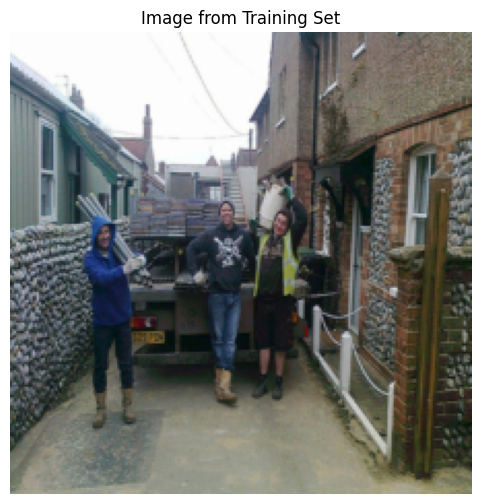

Length: tensor(29)
Processed Caption (indices): [2, 45, 29, 42, 41, 2548, 76, 41, 53, 426, 315, 25, 153, 7, 42, 702, 226, 5, 1064, 440, 6, 5, 286, 14, 49, 17, 5, 99, 3]


In [12]:
import matplotlib.pyplot as plt

# Fetch one batch from the training DataLoader
for batch in valid_dataloader:
    images, targets, length, other = batch
    break  # Only take the first batch

# Select the first instance from the batch
image = images[0]  # PIL Image
target = targets[0]  # Processed caption as tensor
length = length[0]  # Original cleaned caption

# Convert the image tensor to a format suitable for visualization
def tensor_to_image(image_tensor):
    image_tensor = image_tensor.permute(1, 2, 0)  # Convert to (H, W, C)
    image_tensor = image_tensor * torch.tensor([0.229, 0.224, 0.225])  # Reapply std
    image_tensor = image_tensor + torch.tensor([0.485, 0.456, 0.406])  # Reapply mean
    image_tensor = image_tensor.clamp(0, 1)  # Ensure values are in [0, 1]
    return image_tensor.numpy()

# Visualize the image and print its caption
plt.figure(figsize=(6, 6))
plt.imshow(tensor_to_image(image))
plt.axis("off")
plt.title("Image from Training Set")
plt.show()

# Print the raw and processed captions
print("Length:", length)
print("Processed Caption (indices):", target.tolist())


# Attention implementation

In [ ]:
import os
import numpy as np
import h5py
import json
import torch
#from scipy.misc import imread, imresize
from imageio import imread, imwrite, imresize

from tqdm import tqdm
from collections import Counter
from random import seed, choice, sample


def create_input_files(dataset, karpathy_json_path, image_folder, captions_per_image, min_word_freq, output_folder,
                       max_len=100):
    """
    Creates input files for training, validation, and test data.

    :param dataset: name of dataset, one of 'coco', 'flickr8k', 'flickr30k'
    :param karpathy_json_path: path of Karpathy JSON file with splits and captions
    :param image_folder: folder with downloaded images
    :param captions_per_image: number of captions to sample per image
    :param min_word_freq: words occuring less frequently than this threshold are binned as <unk>s
    :param output_folder: folder to save files
    :param max_len: don't sample captions longer than this length
    """

    assert dataset in {'coco', 'flickr8k', 'flickr30k'}

    # Read Karpathy JSON
    with open(karpathy_json_path, 'r') as j:
        data = json.load(j)

    # Read image paths and captions for each image
    train_image_paths = []
    train_image_captions = []
    val_image_paths = []
    val_image_captions = []
    test_image_paths = []
    test_image_captions = []
    word_freq = Counter()

    for img in data['images']:
        captions = []
        for c in img['sentences']:
            # Update word frequency
            word_freq.update(c['tokens'])
            if len(c['tokens']) <= max_len:
                captions.append(c['tokens'])

        if len(captions) == 0:
            continue

        path = os.path.join(image_folder, img['filepath'], img['filename']) if dataset == 'coco' else os.path.join(
            image_folder, img['filename'])

        if img['split'] in {'train', 'restval'}:
            train_image_paths.append(path)
            train_image_captions.append(captions)
        elif img['split'] in {'val'}:
            val_image_paths.append(path)
            val_image_captions.append(captions)
        elif img['split'] in {'test'}:
            test_image_paths.append(path)
            test_image_captions.append(captions)

    # Sanity check
    assert len(train_image_paths) == len(train_image_captions)
    assert len(val_image_paths) == len(val_image_captions)
    assert len(test_image_paths) == len(test_image_captions)

    # Create word map
    words = [w for w in word_freq.keys() if word_freq[w] > min_word_freq]
    word_map = {k: v + 1 for v, k in enumerate(words)}
    word_map['<unk>'] = len(word_map) + 1
    word_map['<start>'] = len(word_map) + 1
    word_map['<end>'] = len(word_map) + 1
    word_map['<pad>'] = 0

    # Create a base/root name for all output files
    base_filename = dataset + '_' + str(captions_per_image) + '_cap_per_img_' + str(min_word_freq) + '_min_word_freq'

    # Save word map to a JSON
    with open(os.path.join(output_folder, 'WORDMAP_' + base_filename + '.json'), 'w') as j:
        json.dump(word_map, j)

    # Sample captions for each image, save images to HDF5 file, and captions and their lengths to JSON files
    seed(123)
    for impaths, imcaps, split in [(train_image_paths, train_image_captions, 'TRAIN'),
                                   (val_image_paths, val_image_captions, 'VAL'),
                                   (test_image_paths, test_image_captions, 'TEST')]:

        with h5py.File(os.path.join(output_folder, split + '_IMAGES_' + base_filename + '.hdf5'), 'a') as h:
            # Make a note of the number of captions we are sampling per image
            h.attrs['captions_per_image'] = captions_per_image

            # Create dataset inside HDF5 file to store images
            images = h.create_dataset('images', (len(impaths), 3, 256, 256), dtype='uint8')

            print("\nReading %s images and captions, storing to file...\n" % split)

            enc_captions = []
            caplens = []

            for i, path in enumerate(tqdm(impaths)):

                # Sample captions
                if len(imcaps[i]) < captions_per_image:
                    captions = imcaps[i] + [choice(imcaps[i]) for _ in range(captions_per_image - len(imcaps[i]))]
                else:
                    captions = sample(imcaps[i], k=captions_per_image)

                # Sanity check
                assert len(captions) == captions_per_image

                # Read images
                img = imread(impaths[i])
                if len(img.shape) == 2:
                    img = img[:, :, np.newaxis]
                    img = np.concatenate([img, img, img], axis=2)
                img = imresize(img, (256, 256))
                img = img.transpose(2, 0, 1)
                assert img.shape == (3, 256, 256)
                assert np.max(img) <= 255

                # Save image to HDF5 file
                images[i] = img

                for j, c in enumerate(captions):
                    # Encode captions
                    enc_c = [word_map['<start>']] + [word_map.get(word, word_map['<unk>']) for word in c] + [
                        word_map['<end>']] + [word_map['<pad>']] * (max_len - len(c))

                    # Find caption lengths
                    c_len = len(c) + 2

                    enc_captions.append(enc_c)
                    caplens.append(c_len)

            # Sanity check
            assert images.shape[0] * captions_per_image == len(enc_captions) == len(caplens)

            # Save encoded captions and their lengths to JSON files
            with open(os.path.join(output_folder, split + '_CAPTIONS_' + base_filename + '.json'), 'w') as j:
                json.dump(enc_captions, j)

            with open(os.path.join(output_folder, split + '_CAPLENS_' + base_filename + '.json'), 'w') as j:
                json.dump(caplens, j)


def init_embedding(embeddings):
    """
    Fills embedding tensor with values from the uniform distribution.

    :param embeddings: embedding tensor
    """
    bias = np.sqrt(3.0 / embeddings.size(1))
    torch.nn.init.uniform_(embeddings, -bias, bias)


def load_embeddings(emb_file, word_map):
    """
    Creates an embedding tensor for the specified word map, for loading into the model.

    :param emb_file: file containing embeddings (stored in GloVe format)
    :param word_map: word map
    :return: embeddings in the same order as the words in the word map, dimension of embeddings
    """

    # Find embedding dimension
    with open(emb_file, 'r') as f:
        emb_dim = len(f.readline().split(' ')) - 1

    vocab = set(word_map.keys())

    # Create tensor to hold embeddings, initialize
    embeddings = torch.FloatTensor(len(vocab), emb_dim)
    init_embedding(embeddings)

    # Read embedding file
    print("\nLoading embeddings...")
    for line in open(emb_file, 'r'):
        line = line.split(' ')

        emb_word = line[0]
        embedding = list(map(lambda t: float(t), filter(lambda n: n and not n.isspace(), line[1:])))

        # Ignore word if not in train_vocab
        if emb_word not in vocab:
            continue

        embeddings[word_map[emb_word]] = torch.FloatTensor(embedding)

    return embeddings, emb_dim


def clip_gradient(optimizer, grad_clip):
    """
    Clips gradients computed during backpropagation to avoid explosion of gradients.

    :param optimizer: optimizer with the gradients to be clipped
    :param grad_clip: clip value
    """
    for group in optimizer.param_groups:
        for param in group['params']:
            if param.grad is not None:
                param.grad.data.clamp_(-grad_clip, grad_clip)


def save_checkpoint(data_name, epoch, epochs_since_improvement, encoder, decoder, encoder_optimizer, decoder_optimizer,
                    bleu4, is_best):
    """
    Saves model checkpoint.

    :param data_name: base name of processed dataset
    :param epoch: epoch number
    :param epochs_since_improvement: number of epochs since last improvement in BLEU-4 score
    :param encoder: encoder model
    :param decoder: decoder model
    :param encoder_optimizer: optimizer to update encoder's weights, if fine-tuning
    :param decoder_optimizer: optimizer to update decoder's weights
    :param bleu4: validation BLEU-4 score for this epoch
    :param is_best: is this checkpoint the best so far?
    """
    state = {'epoch': epoch,
             'epochs_since_improvement': epochs_since_improvement,
             'bleu-4': bleu4,
             'encoder': encoder,
             'decoder': decoder,
             'encoder_optimizer': encoder_optimizer,
             'decoder_optimizer': decoder_optimizer}
    filename = 'checkpoint_' + data_name + '.pth.tar'
    torch.save(state, filename)
    # If this checkpoint is the best so far, store a copy so it doesn't get overwritten by a worse checkpoint
    if is_best:
        torch.save(state, 'BEST_' + filename)


class AverageMeter(object):
    """
    Keeps track of most recent, average, sum, and count of a metric.
    """

    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count


def adjust_learning_rate(optimizer, shrink_factor):
    """
    Shrinks learning rate by a specified factor.

    :param optimizer: optimizer whose learning rate must be shrunk.
    :param shrink_factor: factor in interval (0, 1) to multiply learning rate with.
    """

    print("\nDECAYING learning rate.")
    for param_group in optimizer.param_groups:
        param_group['lr'] = param_group['lr'] * shrink_factor
    print("The new learning rate is %f\n" % (optimizer.param_groups[0]['lr'],))


def accuracy(scores, targets, k):
    """
    Computes top-k accuracy, from predicted and true labels.

    :param scores: scores from the model
    :param targets: true labels
    :param k: k in top-k accuracy
    :return: top-k accuracy
    """

    batch_size = targets.size(0)
    _, ind = scores.topk(k, 1, True, True)
    correct = ind.eq(targets.view(-1, 1).expand_as(ind))
    correct_total = correct.view(-1).float().sum()  # 0D tensor
    return correct_total.item() * (100.0 / batch_size)

In [14]:
import torch
from torch import nn
import torchvision

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


class Encoder(nn.Module):
    """
    Encoder.
    """

    def __init__(self, encoded_image_size=14):
        super(Encoder, self).__init__()
        self.enc_image_size = encoded_image_size

        resnet = torchvision.models.resnet101(pretrained=True)  # pretrained ImageNet ResNet-101

        # Remove linear and pool layers (since we're not doing classification)
        modules = list(resnet.children())[:-2]
        self.resnet = nn.Sequential(*modules)

        # Resize image to fixed size to allow input images of variable size
        self.adaptive_pool = nn.AdaptiveAvgPool2d((encoded_image_size, encoded_image_size))

        self.fine_tune()

    def forward(self, images):
        """
        Forward propagation.

        :param images: images, a tensor of dimensions (batch_size, 3, image_size, image_size)
        :return: encoded images
        """
        out = self.resnet(images)  # (batch_size, 2048, image_size/32, image_size/32)
        out = self.adaptive_pool(out)  # (batch_size, 2048, encoded_image_size, encoded_image_size)
        out = out.permute(0, 2, 3, 1)  # (batch_size, encoded_image_size, encoded_image_size, 2048)
        return out

    def fine_tune(self, fine_tune=True):
        """
        Allow or prevent the computation of gradients for convolutional blocks 2 through 4 of the encoder.
        :param fine_tune: Allow?
        """
        for p in self.resnet.parameters():
            p.requires_grad = False
        # If fine-tuning, only fine-tune convolutional blocks 2 through 4
        for c in list(self.resnet.children())[5:]:
            for p in c.parameters():
                p.requires_grad = fine_tune


class Attention(nn.Module):
    """
    Attention Network.
    """

    def __init__(self, encoder_dim, decoder_dim, attention_dim):
        """
        :param encoder_dim: feature size of encoded images
        :param decoder_dim: size of decoder's RNN
        :param attention_dim: size of the attention network
        """
        super(Attention, self).__init__()
        self.encoder_att = nn.Linear(encoder_dim, attention_dim)  # linear layer to transform encoded image
        self.decoder_att = nn.Linear(decoder_dim, attention_dim)  # linear layer to transform decoder's output
        self.full_att = nn.Linear(attention_dim, 1)  # linear layer to calculate values to be softmax-ed
        self.relu = nn.ReLU()
        self.softmax = nn.Softmax(dim=1)  # softmax layer to calculate weights

    def forward(self, encoder_out, decoder_hidden):
        """
        Forward propagation.

        :param encoder_out: encoded images, a tensor of dimension (batch_size, num_pixels, encoder_dim)
        :param decoder_hidden: previous decoder output, a tensor of dimension (batch_size, decoder_dim)
        :return: attention weighted encoding, weights
        """
        att1 = self.encoder_att(encoder_out)  # (batch_size, num_pixels, attention_dim)
        att2 = self.decoder_att(decoder_hidden)  # (batch_size, attention_dim)
        att = self.full_att(self.relu(att1 + att2.unsqueeze(1))).squeeze(2)  # (batch_size, num_pixels)
        alpha = self.softmax(att)  # (batch_size, num_pixels)
        attention_weighted_encoding = (encoder_out * alpha.unsqueeze(2)).sum(dim=1)  # (batch_size, encoder_dim)

        return attention_weighted_encoding, alpha


class DecoderWithAttention(nn.Module):
    """
    Decoder.
    """

    def __init__(self, attention_dim, embed_dim, decoder_dim, vocab_size, encoder_dim=2048, dropout=0.5):
        """
        :param attention_dim: size of attention network
        :param embed_dim: embedding size
        :param decoder_dim: size of decoder's RNN
        :param vocab_size: size of vocabulary
        :param encoder_dim: feature size of encoded images
        :param dropout: dropout
        """
        super(DecoderWithAttention, self).__init__()

        self.encoder_dim = encoder_dim
        self.attention_dim = attention_dim
        self.embed_dim = embed_dim
        self.decoder_dim = decoder_dim
        self.vocab_size = vocab_size
        self.dropout = dropout

        self.attention = Attention(encoder_dim, decoder_dim, attention_dim)  # attention network

        self.embedding = nn.Embedding(vocab_size, embed_dim)  # embedding layer
        self.dropout = nn.Dropout(p=self.dropout)
        self.decode_step = nn.LSTMCell(embed_dim + encoder_dim, decoder_dim, bias=True)  # decoding LSTMCell
        self.init_h = nn.Linear(encoder_dim, decoder_dim)  # linear layer to find initial hidden state of LSTMCell
        self.init_c = nn.Linear(encoder_dim, decoder_dim)  # linear layer to find initial cell state of LSTMCell
        self.f_beta = nn.Linear(decoder_dim, encoder_dim)  # linear layer to create a sigmoid-activated gate
        self.sigmoid = nn.Sigmoid()
        self.fc = nn.Linear(decoder_dim, vocab_size)  # linear layer to find scores over vocabulary
        self.init_weights()  # initialize some layers with the uniform distribution

    def init_weights(self):
        """
        Initializes some parameters with values from the uniform distribution, for easier convergence.
        """
        self.embedding.weight.data.uniform_(-0.1, 0.1)
        self.fc.bias.data.fill_(0)
        self.fc.weight.data.uniform_(-0.1, 0.1)

    def load_pretrained_embeddings(self, embeddings):
        """
        Loads embedding layer with pre-trained embeddings.

        :param embeddings: pre-trained embeddings
        """
        self.embedding.weight = nn.Parameter(embeddings)

    def fine_tune_embeddings(self, fine_tune=True):
        """
        Allow fine-tuning of embedding layer? (Only makes sense to not-allow if using pre-trained embeddings).

        :param fine_tune: Allow?
        """
        for p in self.embedding.parameters():
            p.requires_grad = fine_tune

    def init_hidden_state(self, encoder_out):
        """
        Creates the initial hidden and cell states for the decoder's LSTM based on the encoded images.

        :param encoder_out: encoded images, a tensor of dimension (batch_size, num_pixels, encoder_dim)
        :return: hidden state, cell state
        """
        mean_encoder_out = encoder_out.mean(dim=1)
        h = self.init_h(mean_encoder_out)  # (batch_size, decoder_dim)
        c = self.init_c(mean_encoder_out)
        return h, c

    def forward(self, encoder_out, encoded_captions, caption_lengths):
        """
        Forward propagation.

        :param encoder_out: encoded images, a tensor of dimension (batch_size, enc_image_size, enc_image_size, encoder_dim)
        :param encoded_captions: encoded captions, a tensor of dimension (batch_size, max_caption_length)
        :param caption_lengths: caption lengths, a tensor of dimension (batch_size, 1)
        :return: scores for vocabulary, sorted encoded captions, decode lengths, weights, sort indices
        """

        batch_size = encoder_out.size(0)
        encoder_dim = encoder_out.size(-1)
        vocab_size = self.vocab_size

        # Flatten image
        encoder_out = encoder_out.view(batch_size, -1, encoder_dim)  # (batch_size, num_pixels, encoder_dim)
        num_pixels = encoder_out.size(1)
        #print("caption_lengths shape before squeeze:", caption_lengths.shape)
        # Sort input data by decreasing lengths; why? apparent below
        caption_lengths, sort_ind = caption_lengths.sort(dim=0, descending=True) #
        encoder_out = encoder_out[sort_ind]
        encoded_captions = encoded_captions[sort_ind]

        # Embedding
        embeddings = self.embedding(encoded_captions)  # (batch_size, max_caption_length, embed_dim)

        # Initialize LSTM state
        h, c = self.init_hidden_state(encoder_out)  # (batch_size, decoder_dim)

        # We won't decode at the <end> position, since we've finished generating as soon as we generate <end>
        # So, decoding lengths are actual lengths - 1
        decode_lengths = (caption_lengths - 1).tolist()

        # Create tensors to hold word predicion scores and alphas
        predictions = torch.zeros(batch_size, max(decode_lengths), vocab_size).to(device)
        alphas = torch.zeros(batch_size, max(decode_lengths), num_pixels).to(device)

        # At each time-step, decode by
        # attention-weighing the encoder's output based on the decoder's previous hidden state output
        # then generate a new word in the decoder with the previous word and the attention weighted encoding
        for t in range(max(decode_lengths)):
            batch_size_t = sum([l > t for l in decode_lengths])
            attention_weighted_encoding, alpha = self.attention(encoder_out[:batch_size_t],
                                                                h[:batch_size_t])
            gate = self.sigmoid(self.f_beta(h[:batch_size_t]))  # gating scalar, (batch_size_t, encoder_dim)
            attention_weighted_encoding = gate * attention_weighted_encoding
            h, c = self.decode_step(
                torch.cat([embeddings[:batch_size_t, t, :], attention_weighted_encoding], dim=1),
                (h[:batch_size_t], c[:batch_size_t]))  # (batch_size_t, decoder_dim)
            preds = self.fc(self.dropout(h))  # (batch_size_t, vocab_size)
            predictions[:batch_size_t, t, :] = preds
            alphas[:batch_size_t, t, :] = alpha

        return predictions, encoded_captions, decode_lengths, alphas, sort_ind

In [15]:
import time
import torch.backends.cudnn as cudnn
import torch.optim
import torch.utils.data
import torchvision.transforms as transforms
from torch import nn
from torch.nn.utils.rnn import pack_padded_sequence

from datasets import *
#from utils import *
from nltk.translate.bleu_score import corpus_bleu


In [16]:
def train(train_loader, encoder, decoder, criterion, encoder_optimizer, decoder_optimizer, epoch):
    """
    Performs one epoch's training.

    :param train_loader: DataLoader for training data
    :param encoder: encoder model
    :param decoder: decoder model
    :param criterion: loss layer
    :param encoder_optimizer: optimizer to update encoder's weights (if fine-tuning)
    :param decoder_optimizer: optimizer to update decoder's weights
    :param epoch: epoch number
    """

    decoder.train()  # train mode (dropout and batchnorm is used)
    encoder.train()

    batch_time = AverageMeter()  # forward prop. + back prop. time
    data_time = AverageMeter()  # data loading time
    losses = AverageMeter()  # loss (per word decoded)
    top5accs = AverageMeter()  # top5 accuracy

    start = time.time()

    # Batches
    for i, (imgs, caps, caplens) in enumerate(train_loader):
        data_time.update(time.time() - start)

        # Move to GPU, if available
        imgs = imgs.to(device)
        caps = caps.to(device)
        caplens = caplens.to(device)

        # Forward prop.
        imgs = encoder(imgs)
        scores, caps_sorted, decode_lengths, alphas, sort_ind = decoder(imgs, caps, caplens)

        # Since we decoded starting with <start>, the targets are all words after <start>, up to <end>
        targets = caps_sorted[:, 1:]

        # Remove timesteps that we didn't decode at, or are pads
        # pack_padded_sequence is an easy trick to do this
        #scores, _ = pack_padded_sequence(scores, decode_lengths, batch_first=True)
        scores = pack_padded_sequence(scores, decode_lengths, batch_first=True).data
        #targets, _ = pack_padded_sequence(targets, decode_lengths, batch_first=True)
        targets = pack_padded_sequence(targets, decode_lengths, batch_first=True).data
        
        # Calculate loss
        loss = criterion(scores, targets)

        # Add doubly stochastic attention regularization
        loss += alpha_c * ((1. - alphas.sum(dim=1)) ** 2).mean()

        # Back prop.
        decoder_optimizer.zero_grad()
        if encoder_optimizer is not None:
            encoder_optimizer.zero_grad()
        loss.backward()

        # Clip gradients
        if grad_clip is not None:
            clip_gradient(decoder_optimizer, grad_clip)
            if encoder_optimizer is not None:
                clip_gradient(encoder_optimizer, grad_clip)

        # Update weights
        decoder_optimizer.step()
        if encoder_optimizer is not None:
            encoder_optimizer.step()

        # Keep track of metrics
        top5 = accuracy(scores, targets, 5)
        losses.update(loss.item(), sum(decode_lengths))
        top5accs.update(top5, sum(decode_lengths))
        batch_time.update(time.time() - start)

        start = time.time()

        #if i % print_freq == 0:
        print('Epoch: [{0}][{1}/{2}]\t'
                  'Batch Time {batch_time.val:.3f} ({batch_time.avg:.3f})\t'
                  'Data Load Time {data_time.val:.3f} ({data_time.avg:.3f})\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Top-5 Accuracy {top5.val:.3f} ({top5.avg:.3f})'.format(epoch, i, len(train_loader),
                                                                          batch_time=batch_time,
                                                                          data_time=data_time, loss=losses,
                                                                          top5=top5accs))
        
def validate(val_loader, encoder, decoder, criterion):
    """
    Performs one epoch's validation.

    :param val_loader: DataLoader for validation data.
    :param encoder: encoder model
    :param decoder: decoder model
    :param criterion: loss layer
    :return: BLEU-4 score
    """
    decoder.eval()  # eval mode (no dropout or batchnorm)
    if encoder is not None:
        encoder.eval()

    batch_time = AverageMeter()
    losses = AverageMeter()
    top5accs = AverageMeter()

    start = time.time()

    references = list()  # references (true captions) for calculating BLEU-4 score
    hypotheses = list()  # hypotheses (predictions)

    # explicitly disable gradient calculation to avoid CUDA memory error
    # solves the issue #57
    with torch.no_grad():
        # Batches
        for i, (imgs, caps, caplens, allcaps) in enumerate(val_loader):

            # Move to device, if available
            imgs = imgs.to(device)
            caps = caps.to(device)
            caplens = caplens.to(device)

            # Forward prop.
            if encoder is not None:
                imgs = encoder(imgs)
            scores, caps_sorted, decode_lengths, alphas, sort_ind = decoder(imgs, caps, caplens)

            # Since we decoded starting with <start>, the targets are all words after <start>, up to <end>
            targets = caps_sorted[:, 1:]

            # Remove timesteps that we didn't decode at, or are pads
            # pack_padded_sequence is an easy trick to do this
            scores_copy = scores.clone()
            scores = pack_padded_sequence(scores, decode_lengths, batch_first=True).data
            targets = pack_padded_sequence(targets, decode_lengths, batch_first=True).data
            # Calculate loss
            loss = criterion(scores, targets)

            # Add doubly stochastic attention regularization
            loss += alpha_c * ((1. - alphas.sum(dim=1)) ** 2).mean()

            # Keep track of metrics
            losses.update(loss.item(), sum(decode_lengths))
            top5 = accuracy(scores, targets, 5)
            top5accs.update(top5, sum(decode_lengths))
            batch_time.update(time.time() - start)

            start = time.time()

            #if i % print_freq == 0:
            print('Validation: [{0}/{1}]\t'
                    'Batch Time {batch_time.val:.3f} ({batch_time.avg:.3f})\t'
                    'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                    'Top-5 Accuracy {top5.val:.3f} ({top5.avg:.3f})\t'.format(i, len(val_loader), batch_time=batch_time,
                                                                            loss=losses, top5=top5accs))

            # Store references (true captions), and hypothesis (prediction) for each image
            # If for n images, we have n hypotheses, and references a, b, c... for each image, we need -
            # references = [[ref1a, ref1b, ref1c], [ref2a, ref2b], ...], hypotheses = [hyp1, hyp2, ...]

            # References
            # Ensure that sort_ind is on the same device as allcaps
            sort_ind = sort_ind.to(allcaps.device)

            # Now perform the indexing operation
            allcaps = allcaps[sort_ind]  # because images were sorted in the decoder
            for j in range(allcaps.shape[0]):
                img_caps = allcaps[j].tolist()
                #print("img_caps:", img_caps)
                #img_captions = list(
                    #map(lambda c: [w for w in c if w not in {word_map['<start>'], word_map['<pad>']}],
                        #img_caps))  # remove <start> and pads
                #print("caption:", img_caps)
                img_captions = [
                    w for w in caption if w not in {vocab['<start>'], vocab['<pad>']}
                ]
                references.append(img_captions)

            # Hypotheses
            _, preds = torch.max(scores_copy, dim=2)
            preds = preds.tolist()
            temp_preds = list()
            for j, p in enumerate(preds):
                temp_preds.append(preds[j][:decode_lengths[j]])  # remove pads
            preds = temp_preds
            hypotheses.extend(preds)

            assert len(references) == len(hypotheses)

        # Calculate BLEU-4 scores
        bleu4 = corpus_bleu(references, hypotheses)

        print(
            '\n * LOSS - {loss.avg:.3f}, TOP-5 ACCURACY - {top5.avg:.3f}, BLEU-4 - {bleu}\n'.format(
                loss=losses,
                top5=top5accs,
                bleu=bleu4))

    return bleu4

In [18]:
# Data parameters
#data_folder = '/media/ssd/caption data'  # folder with data files saved by create_input_files.py
data_name = 'models_attention'  # base name shared by data files

# Model parameters
emb_dim = 512  # dimension of word embeddings
attention_dim = 512  # dimension of attention linear layers
decoder_dim = 512  # dimension of decoder RNN
dropout = 0.5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # sets device for model and PyTorch tensors
cudnn.benchmark = True  # set to true only if inputs to model are fixed size; otherwise lot of computational overhead

# Training parameters
start_epoch = 0
epochs = 10  #120 number of epochs to train for (if early stopping is not triggered)
epochs_since_improvement = 0  # keeps track of number of epochs since there's been an improvement in validation BLEU
batch_size = 32
workers = 1  # for data-loading; right now, only 1 works with h5py
encoder_lr = 1e-4  # learning rate for encoder if fine-tuning
decoder_lr = 4e-4  # learning rate for decoder
grad_clip = 5.  # clip gradients at an absolute value of
alpha_c = 1.  # regularization parameter for 'doubly stochastic attention', as in the paper
best_bleu4 = 0.  # BLEU-4 score right now
print_freq = 100  # print training/validation stats every __ batches
fine_tune_encoder = False  # fine-tune encoder?
checkpoint = None  # path to checkpoint, None if none


# Initialize / load checkpoint
if checkpoint is None:
    decoder = DecoderWithAttention(attention_dim=attention_dim,
                                    embed_dim=emb_dim,
                                    decoder_dim=decoder_dim,
                                    vocab_size=len(vocab),
                                    dropout=dropout)
    decoder_optimizer = torch.optim.Adam(params=filter(lambda p: p.requires_grad, decoder.parameters()),
                                            lr=decoder_lr)
    encoder = Encoder()
    encoder.fine_tune(fine_tune_encoder)
    encoder_optimizer = torch.optim.Adam(params=filter(lambda p: p.requires_grad, encoder.parameters()),
                                            lr=encoder_lr) if fine_tune_encoder else None

else:
    checkpoint = torch.load(checkpoint)
    start_epoch = checkpoint['epoch'] + 1
    epochs_since_improvement = checkpoint['epochs_since_improvement']
    best_bleu4 = checkpoint['bleu-4']
    decoder = checkpoint['decoder']
    decoder_optimizer = checkpoint['decoder_optimizer']
    encoder = checkpoint['encoder']
    encoder_optimizer = checkpoint['encoder_optimizer']
    if fine_tune_encoder is True and encoder_optimizer is None:
        encoder.fine_tune(fine_tune_encoder)
        encoder_optimizer = torch.optim.Adam(params=filter(lambda p: p.requires_grad, encoder.parameters()),
                                                lr=encoder_lr)

# Move to GPU, if available
decoder = decoder.to(device)
encoder = encoder.to(device)

# Loss function
criterion = nn.CrossEntropyLoss().to(device)

# Custom dataloaders
#normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
#                                    std=[0.229, 0.224, 0.225])
##train_loader = torch.utils.data.DataLoader(
 #   CaptionDataset(data_folder, data_name, 'TRAIN', transform=transforms.Compose([normalize])),
 #   batch_size=batch_size, shuffle=True, num_workers=workers, pin_memory=True)
#val_loader = torch.utils.data.DataLoader(
#    CaptionDataset(data_folder, data_name, 'VAL', transform=transforms.Compose([normalize])),
#    batch_size=batch_size, shuffle=True, num_workers=workers, pin_memory=True)
#train_dataloader 
#valid_dataloader

# Epochs
for epoch in range(start_epoch, epochs):

    # Decay learning rate if there is no improvement for 8 consecutive epochs, and terminate training after 20
    if epochs_since_improvement == 20:
        break
    if epochs_since_improvement > 0 and epochs_since_improvement % 8 == 0:
        adjust_learning_rate(decoder_optimizer, 0.8)
        if fine_tune_encoder:
            adjust_learning_rate(encoder_optimizer, 0.8)

    # One epoch's training
    train(train_loader=train_dataloader,
            encoder=encoder,
            decoder=decoder,
            criterion=criterion,
            encoder_optimizer=encoder_optimizer,
            decoder_optimizer=decoder_optimizer,
            epoch=epoch)

    # One epoch's validation
    recent_bleu4 = validate(val_loader=valid_dataloader,
                            encoder=encoder,
                            decoder=decoder,
                            criterion=criterion)

    # Check if there was an improvement
    is_best = recent_bleu4 > best_bleu4
    best_bleu4 = max(recent_bleu4, best_bleu4)
    if not is_best:
        epochs_since_improvement += 1
        print("\nEpochs since last improvement: %d\n" % (epochs_since_improvement,))
    else:
        epochs_since_improvement = 0

    # Save checkpoint
    save_checkpoint(data_name, epoch, epochs_since_improvement, encoder, decoder, encoder_optimizer,
                    decoder_optimizer, recent_bleu4, is_best)


Epoch: [0][0/621]	Batch Time 1.117 (1.117)	Data Load Time 0.338 (0.338)	Loss 10.7531 (10.7531)	Top-5 Accuracy 0.000 (0.000)
Epoch: [0][1/621]	Batch Time 0.823 (0.970)	Data Load Time 0.315 (0.327)	Loss 10.5290 (10.6470)	Top-5 Accuracy 6.613 (3.131)
Epoch: [0][2/621]	Batch Time 0.702 (0.881)	Data Load Time 0.261 (0.305)	Loss 10.3107 (10.5362)	Top-5 Accuracy 11.969 (6.043)
Epoch: [0][3/621]	Batch Time 0.701 (0.836)	Data Load Time 0.241 (0.289)	Loss 9.9620 (10.3872)	Top-5 Accuracy 15.608 (8.526)
Epoch: [0][4/621]	Batch Time 0.832 (0.835)	Data Load Time 0.284 (0.288)	Loss 9.8025 (10.2651)	Top-5 Accuracy 16.071 (10.101)
Epoch: [0][5/621]	Batch Time 0.732 (0.818)	Data Load Time 0.249 (0.282)	Loss 9.6332 (10.1645)	Top-5 Accuracy 18.110 (11.376)
Epoch: [0][6/621]	Batch Time 0.742 (0.807)	Data Load Time 0.317 (0.287)	Loss 9.3371 (10.0523)	Top-5 Accuracy 22.754 (12.920)
Epoch: [0][7/621]	Batch Time 0.626 (0.785)	Data Load Time 0.227 (0.279)	Loss 9.0991 (9.9444)	Top-5 Accuracy 23.779 (14.148)
Epoc

In [19]:
save_checkpoint('manual_run_model_attention', epoch, 0, encoder, decoder, encoder_optimizer,
                    decoder_optimizer, 0.56, True)

# Evaluate

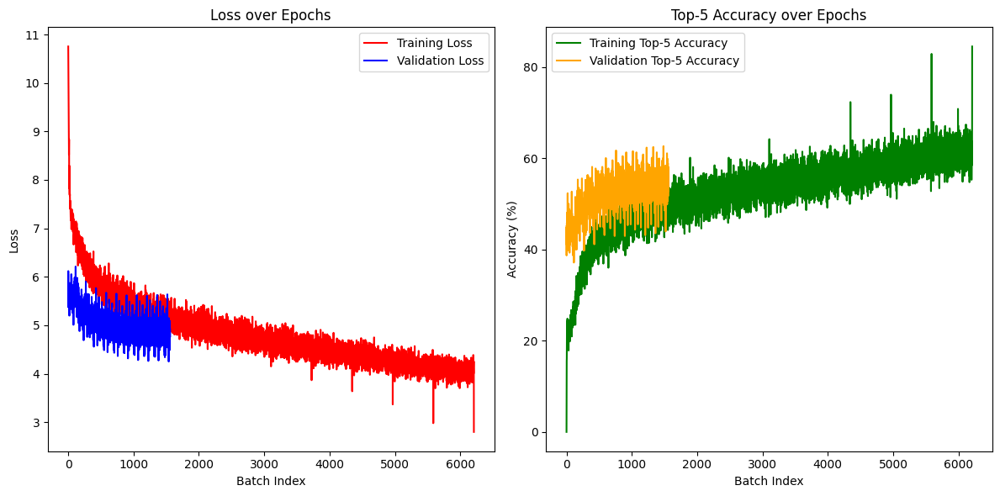

In [1]:
import re
import matplotlib.pyplot as plt

# Function to extract training and validation loss and accuracy
def extract_loss_accuracy(file_path):
    train_loss = []
    train_accuracy = []
    val_loss = []
    val_accuracy = []
    
    # Open and read the file
    with open(file_path, 'r') as file:
        for line in file:
            # Match for training data (Loss and Top-5 Accuracy)
            train_match = re.search(r"Epoch: \[\d+\]\[\d+/\d+\].*Loss ([\d\.]+).*Top-5 Accuracy ([\d\.]+)", line)
            if train_match:
                train_loss.append(float(train_match.group(1)))
                train_accuracy.append(float(train_match.group(2)))
            
            # Match for validation data (Loss and Top-5 Accuracy)
            val_match = re.search(r"Validation: \[\d+/\d+\].*Loss ([\d\.]+).*Top-5 Accuracy ([\d\.]+)", line)
            if val_match:
                val_loss.append(float(val_match.group(1)))
                val_accuracy.append(float(val_match.group(2)))
    
    return train_loss, train_accuracy, val_loss, val_accuracy

# Plotting function for training and validation loss and accuracy
def plot_loss_accuracy(train_loss, train_accuracy, val_loss, val_accuracy):
    # Create figure and axis objects
    plt.figure(figsize=(12, 6))
    
    # Plot Training Loss
    plt.subplot(1, 2, 1)
    plt.plot(train_loss, label='Training Loss', color='r')
    plt.plot(val_loss, label='Validation Loss', color='b')
    plt.title('Loss over Epochs')
    plt.xlabel('Batch Index')
    plt.ylabel('Loss')
    plt.legend()

    # Plot Training Accuracy
    plt.subplot(1, 2, 2)
    plt.plot(train_accuracy, label='Training Top-5 Accuracy', color='g')
    plt.plot(val_accuracy, label='Validation Top-5 Accuracy', color='orange')
    plt.title('Top-5 Accuracy over Epochs')
    plt.xlabel('Batch Index')
    plt.ylabel('Accuracy (%)')
    plt.legend()

    # Show the plots
    plt.tight_layout()
    plt.show()

# Example usage
file_path = './loss_attention/attention_loss.txt'  # Path to your .txt file
train_loss, train_accuracy, val_loss, val_accuracy = extract_loss_accuracy(file_path)
plot_loss_accuracy(train_loss, train_accuracy, val_loss, val_accuracy)


# Visualize results

In [52]:
import torch
import torch.nn.functional as F
import numpy as np
import json
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import skimage.transform
import argparse
from imageio import imread, imwrite
from PIL import Image
from cv2 import resize as imresize 

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


def caption_image_beam_search(encoder, decoder, img, word_map, beam_size=3):
    """
    Reads an image and captions it with beam search.

    :param encoder: encoder model
    :param decoder: decoder model
    :param image_path: path to image
    :param word_map: word map
    :param beam_size: number of sequences to consider at each decode-step
    :return: caption, weights for visualization
    """

    k = beam_size
    vocab_size = len(word_map)

    # Read image and process
    #img = imread(image_path)
    #if img.mode != 'RGB':
        #img = img.convert('RGB')  # Convert grayscale or other modes to RGB
    if len(img.shape) == 2:
        img = img[:, :, np.newaxis]
        img = np.concatenate([img, img, img], axis=2)
    img = imresize(img, (256, 256))
    img = img.transpose(2, 0, 1)
    img = img / 255.
    img = torch.FloatTensor(img).to(device)
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
    transform = transforms.Compose([normalize])
    image = transform(img)  # (3, 256, 256)

    # Encode
    image = image.unsqueeze(0)  # (1, 3, 256, 256)
    encoder_out = encoder(image)  # (1, enc_image_size, enc_image_size, encoder_dim)
    enc_image_size = encoder_out.size(1)
    encoder_dim = encoder_out.size(3)

    # Flatten encoding
    encoder_out = encoder_out.view(1, -1, encoder_dim)  # (1, num_pixels, encoder_dim)
    num_pixels = encoder_out.size(1)

    # We'll treat the problem as having a batch size of k
    encoder_out = encoder_out.expand(k, num_pixels, encoder_dim)  # (k, num_pixels, encoder_dim)

    # Tensor to store top k previous words at each step; now they're just <start>
    k_prev_words = torch.LongTensor([[word_map['<start>']]] * k).to(device)  # (k, 1)

    # Tensor to store top k sequences; now they're just <start>
    seqs = k_prev_words  # (k, 1)

    # Tensor to store top k sequences' scores; now they're just 0
    top_k_scores = torch.zeros(k, 1).to(device)  # (k, 1)

    # Tensor to store top k sequences' alphas; now they're just 1s
    seqs_alpha = torch.ones(k, 1, enc_image_size, enc_image_size).to(device)  # (k, 1, enc_image_size, enc_image_size)

    # Lists to store completed sequences, their alphas and scores
    complete_seqs = list()
    complete_seqs_alpha = list()
    complete_seqs_scores = list()

    # Start decoding
    step = 1
    h, c = decoder.init_hidden_state(encoder_out)

    # s is a number less than or equal to k, because sequences are removed from this process once they hit <end>
    while True:

        embeddings = decoder.embedding(k_prev_words).squeeze(1)  # (s, embed_dim)

        awe, alpha = decoder.attention(encoder_out, h)  # (s, encoder_dim), (s, num_pixels)

        alpha = alpha.view(-1, enc_image_size, enc_image_size)  # (s, enc_image_size, enc_image_size)

        gate = decoder.sigmoid(decoder.f_beta(h))  # gating scalar, (s, encoder_dim)
        awe = gate * awe

        h, c = decoder.decode_step(torch.cat([embeddings, awe], dim=1), (h, c))  # (s, decoder_dim)

        scores = decoder.fc(h)  # (s, vocab_size)
        scores = F.log_softmax(scores, dim=1)

        # Add
        scores = top_k_scores.expand_as(scores) + scores  # (s, vocab_size)

        # For the first step, all k points will have the same scores (since same k previous words, h, c)
        if step == 1:
            top_k_scores, top_k_words = scores[0].topk(k, 0, True, True)  # (s)
        else:
            # Unroll and find top scores, and their unrolled indices
            top_k_scores, top_k_words = scores.view(-1).topk(k, 0, True, True)  # (s)

        # Convert unrolled indices to actual indices of scores
        prev_word_inds = (top_k_words / vocab_size).long()  # Beam indices
        next_word_inds = (top_k_words % vocab_size).long()  # Word indices
        #print("next_word_inds:", next_word_inds)
        #print(prev_word_inds)
        #print(seqs[prev_word_inds])

        # Add new words to sequences, alphas
        seqs = torch.cat([seqs[prev_word_inds], next_word_inds.unsqueeze(1)], dim=1)  # (s, step+1)
        seqs_alpha = torch.cat([seqs_alpha[prev_word_inds], alpha[prev_word_inds].unsqueeze(1)],
                               dim=1)  # (s, step+1, enc_image_size, enc_image_size)

        # Which sequences are incomplete (didn't reach <end>)?
        incomplete_inds = [ind for ind, next_word in enumerate(next_word_inds) if
                           next_word != word_map['<end>']]
        complete_inds = list(set(range(len(next_word_inds))) - set(incomplete_inds))

        # Set aside complete sequences
        if len(complete_inds) > 0:
            complete_seqs.extend(seqs[complete_inds].tolist())
            complete_seqs_alpha.extend(seqs_alpha[complete_inds].tolist())
            complete_seqs_scores.extend(top_k_scores[complete_inds])
        k -= len(complete_inds)  # reduce beam length accordingly

        # Proceed with incomplete sequences
        if k == 0:
            break
        seqs = seqs[incomplete_inds]
        seqs_alpha = seqs_alpha[incomplete_inds]
        h = h[prev_word_inds[incomplete_inds]]
        c = c[prev_word_inds[incomplete_inds]]
        encoder_out = encoder_out[prev_word_inds[incomplete_inds]]
        top_k_scores = top_k_scores[incomplete_inds].unsqueeze(1)
        k_prev_words = next_word_inds[incomplete_inds].unsqueeze(1)

        # Break if things have been going on too long
        if step > 50:
            break
        step += 1

    i = complete_seqs_scores.index(max(complete_seqs_scores))
    seq = complete_seqs[i]
    alphas = complete_seqs_alpha[i]

    return seq, alphas


def visualize_att(image, seq, alphas, rev_word_map, smooth=True):
    """
    Visualizes caption with weights at every word.

    Adapted from paper authors' repo: https://github.com/kelvinxu/arctic-captions/blob/master/alpha_visualization.ipynb

    :param image_path: path to image that has been captioned
    :param seq: caption
    :param alphas: weights
    :param rev_word_map: reverse word mapping, i.e. ix2word
    :param smooth: smooth weights?
    """
    #image = Image.open(image_path)
    image = image.resize([14 * 24, 14 * 24], Image.LANCZOS)
    #print(seq)
    words = [rev_word_map[ind] for ind in seq]

    for t in range(len(words)):
        if t > 50:
            break
        plt.subplot(int(np.ceil(len(words) / 5.)), 5, t + 1)

        plt.text(0, 1, '%s' % (words[t]), color='black', backgroundcolor='white', fontsize=12)
        plt.imshow(image)
        current_alpha = alphas[t, :]
        if smooth:
            alpha = skimage.transform.pyramid_expand(current_alpha.numpy(), upscale=24, sigma=8)
        else:
            alpha = skimage.transform.resize(current_alpha.numpy(), [14 * 24, 14 * 24])
        if t == 0:
            plt.imshow(alpha, alpha=0)
        else:
            plt.imshow(alpha, alpha=0.8)
        plt.set_cmap(cm.Greys_r)
        plt.axis('off')
    plt.show()



#parser = argparse.ArgumentParser(description='Show, Attend, and Tell - Tutorial - Generate Caption')

#parser.add_argument('--img', '-i', help='path to image')
#parser.add_argument('--model', '-m', help='path to model')
#parser.add_argument('--word_map', '-wm', help='path to word map JSON')
#parser.add_argument('--beam_size', '-b', default=5, type=int, help='beam size for beam search')
#parser.add_argument('--dont_smooth', dest='smooth', action='store_false', help='do not smooth alpha overlay')

#args = parser.parse_args()

# Load model
checkpoint = torch.load('./BEST_checkpoint_manual_run_model_attention.pth.tar', map_location=str(device))
decoder = checkpoint['decoder']
decoder = decoder.to(device)
decoder.eval()
encoder = checkpoint['encoder']
encoder = encoder.to(device)
encoder.eval()

#seq, alphas = caption_image_beam_search(encoder, decoder,image_dir , vocab, 5)
#alphas = torch.FloatTensor(alphas)

# Visualize caption and attention of best sequence
#visualize_att(image_dir, seq, alphas, vocab, True)

C:\Users\ALEJANDRO\AppData\Local\Temp\ipykernel_5856\146090670.py:206: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('./BEST_checkpoint_manual_run_mo

Encoder(
  (resnet): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2d(64, 2

# Inference

C:\Users\ALEJANDRO\AppData\Local\Temp\ipykernel_5856\850547077.py:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imread('./test_images/media._SL480_.jpeg')


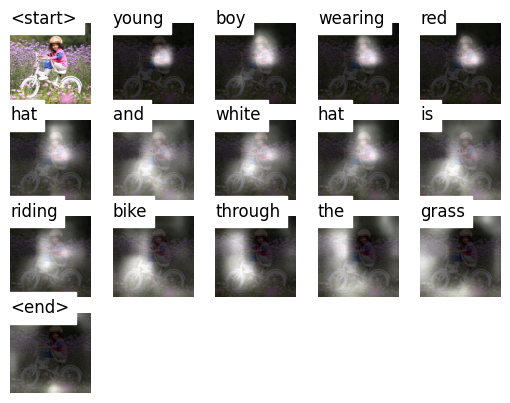

In [55]:
img = imread('./test_images/media._SL480_.jpeg')
image = Image.open('./test_images/media._SL480_.jpeg')

seq, alphas = caption_image_beam_search(encoder, decoder,img , vocab, 5)
alphas = torch.FloatTensor(alphas)

# Visualize caption and attention of best sequence
visualize_att(image, seq, alphas, vocab, True)

# Evaluation

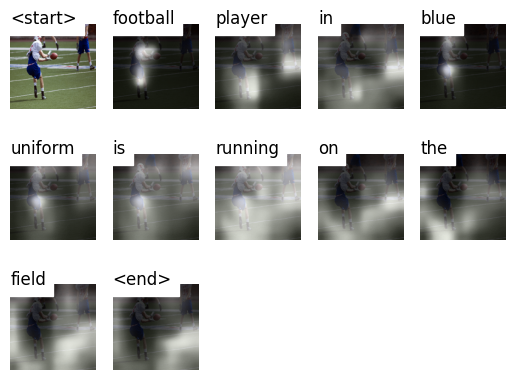

BLEU-4 score is 0.0568.


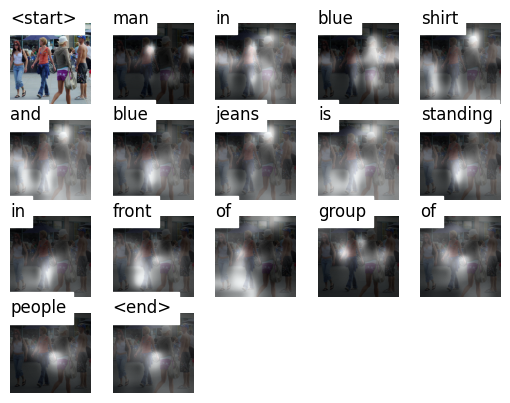

BLEU-4 score is 0.0199.


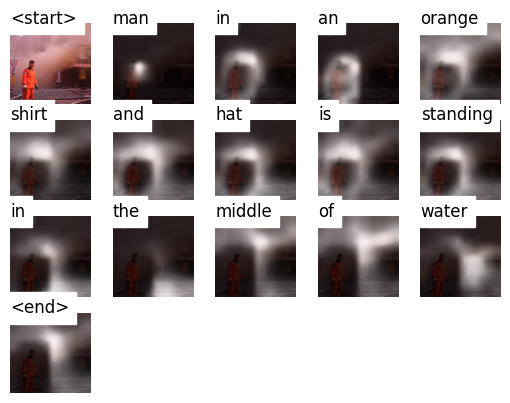

BLEU-4 score is 0.2421.


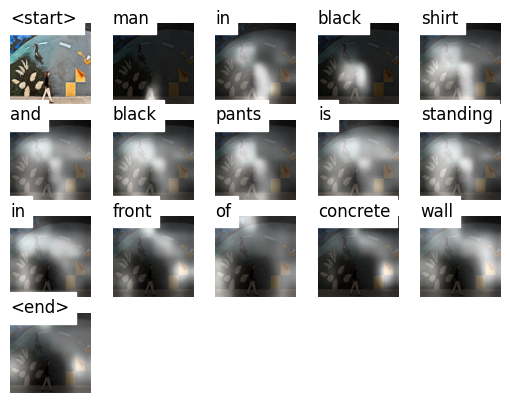

BLEU-4 score is 0.0256.


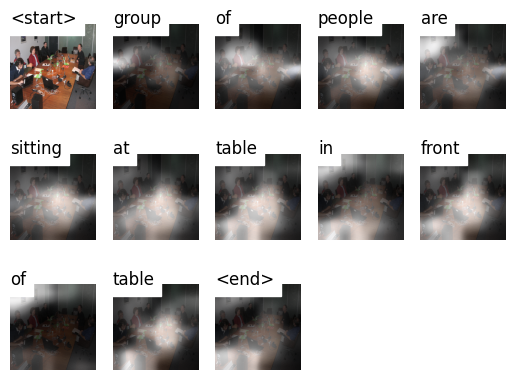

BLEU-4 score is 0.2471.


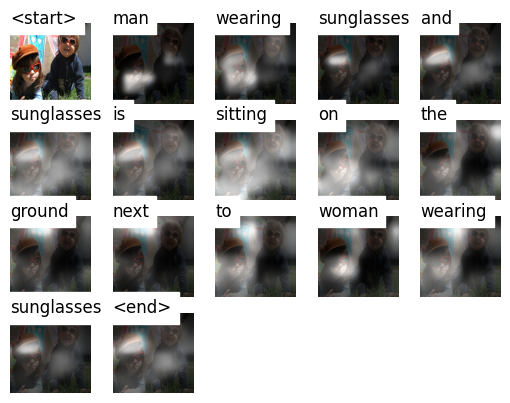

BLEU-4 score is 0.0409.


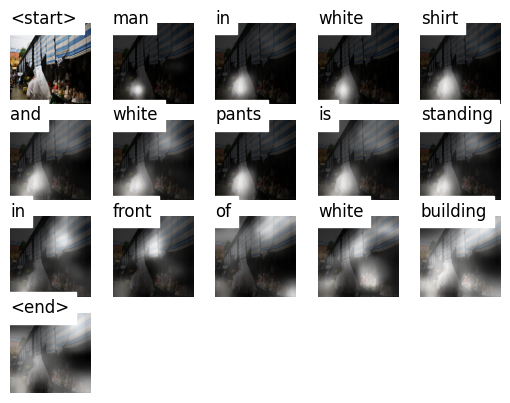

BLEU-4 score is 0.0458.


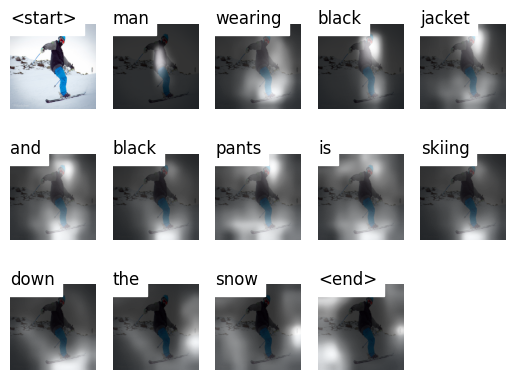

BLEU-4 score is 0.0768.


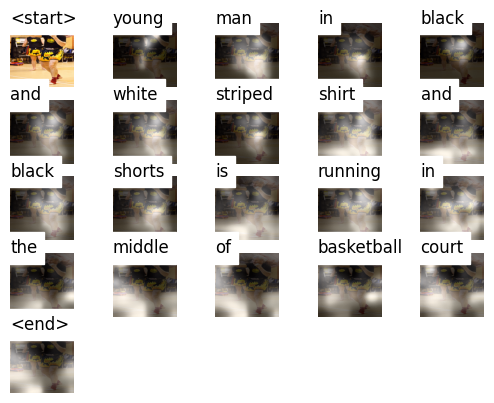

BLEU-4 score is 0.0878.


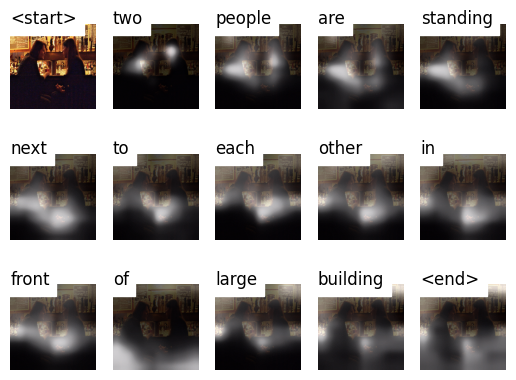

BLEU-4 score is 0.0428.


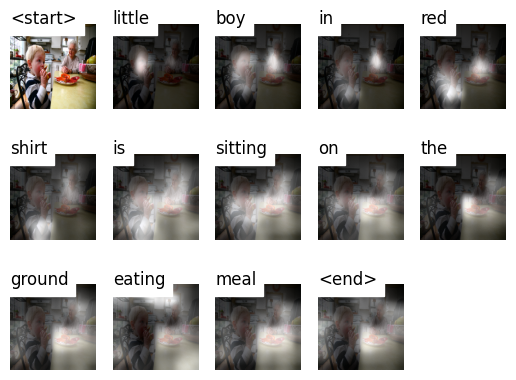

BLEU-4 score is 0.0489.


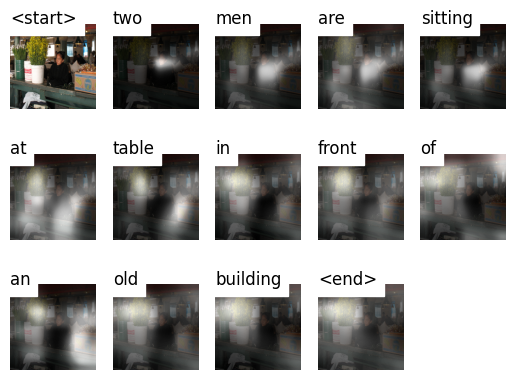

BLEU-4 score is 0.0491.


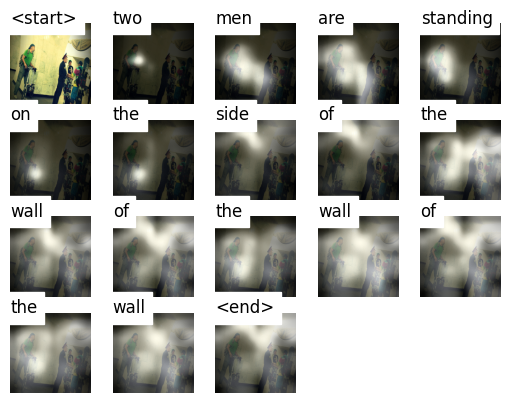

BLEU-4 score is 0.0201.


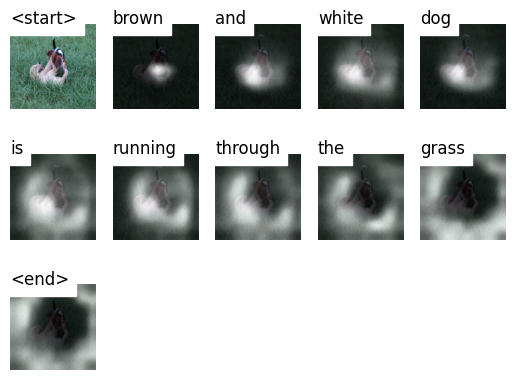

BLEU-4 score is 0.0574.


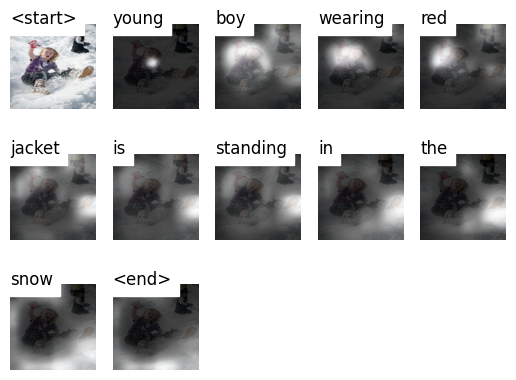

BLEU-4 score is 0.1259.


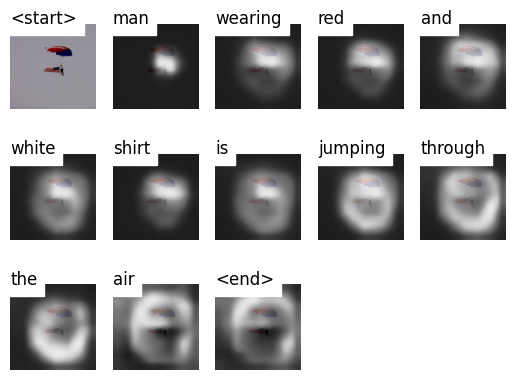

BLEU-4 score is 0.1106.


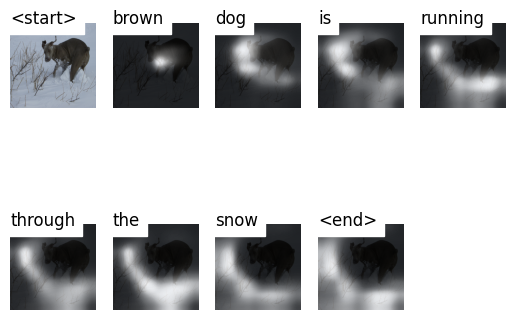

BLEU-4 score is 0.1389.


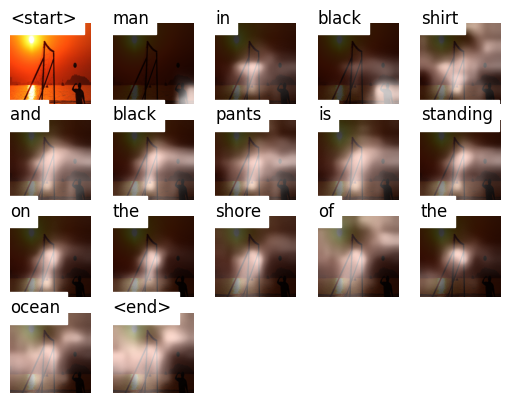

BLEU-4 score is 0.0471.


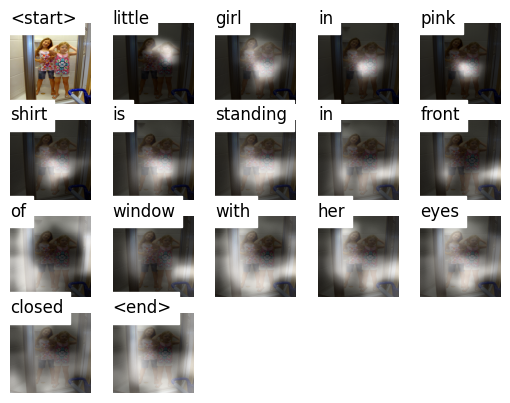

BLEU-4 score is 0.0381.


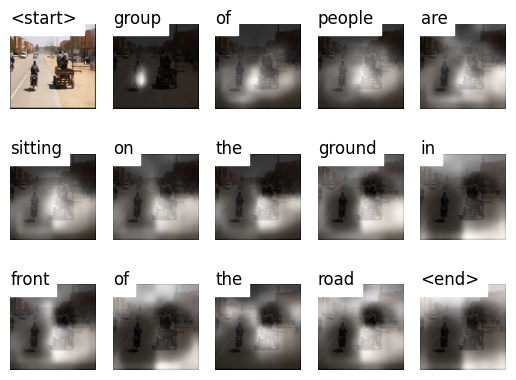

BLEU-4 score is 0.0243.


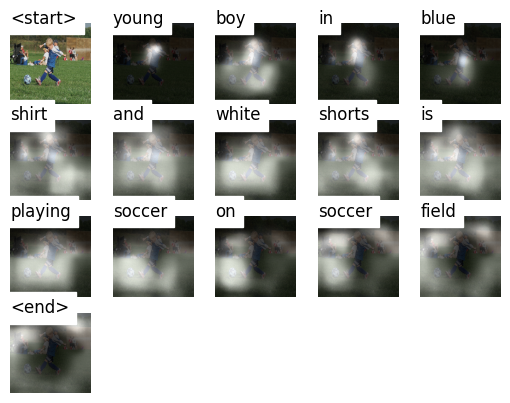

BLEU-4 score is 0.1361.


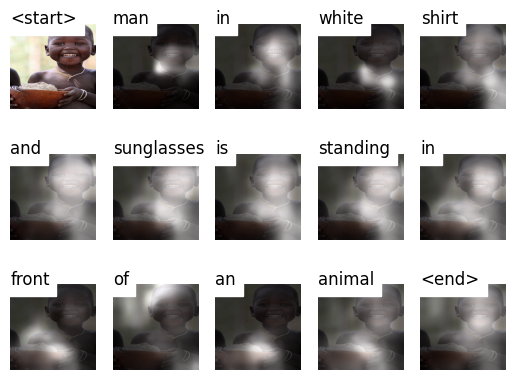

BLEU-4 score is 0.0270.


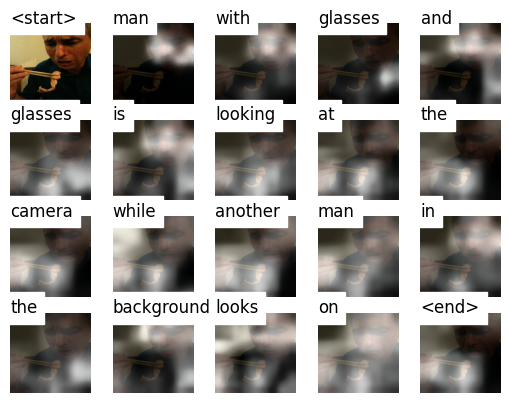

BLEU-4 score is 0.0441.


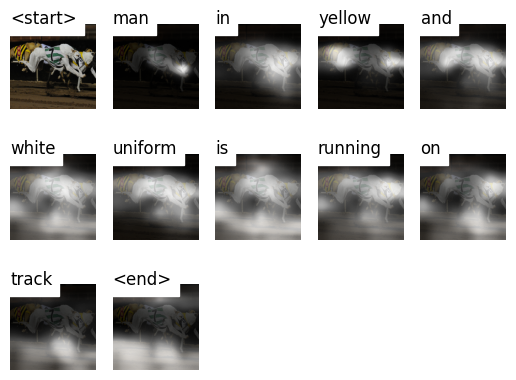

BLEU-4 score is 0.0238.


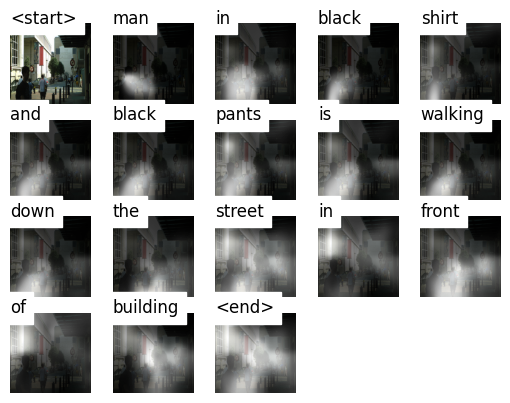

BLEU-4 score is 0.0749.


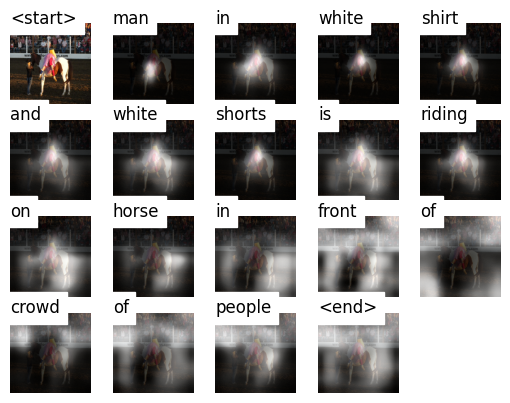

BLEU-4 score is 0.1403.


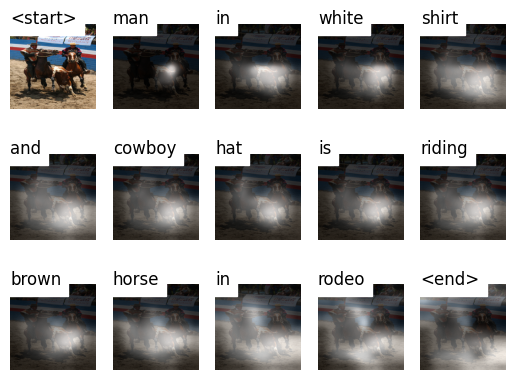

BLEU-4 score is 0.0235.


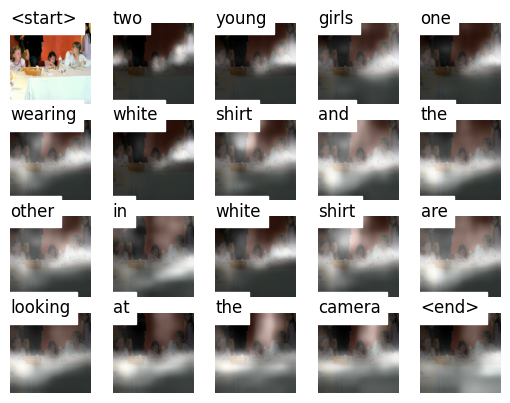

BLEU-4 score is 0.0147.


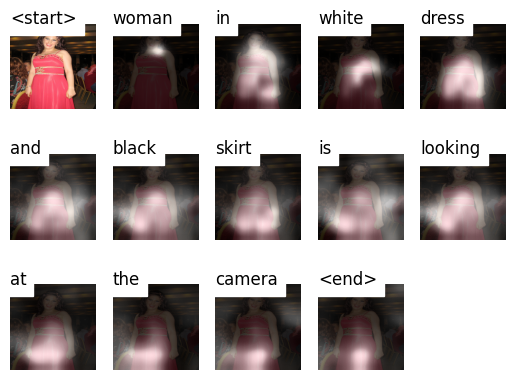

BLEU-4 score is 0.0286.


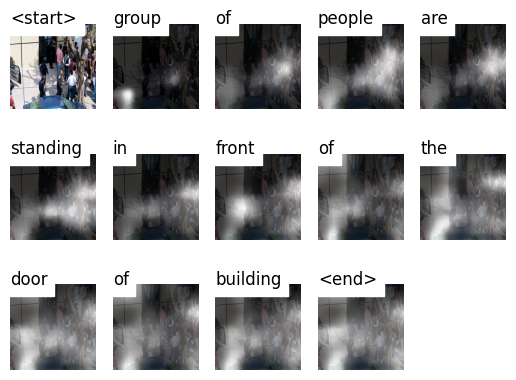

BLEU-4 score is 0.1312.


In [90]:
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
smoothie = SmoothingFunction().method4

for i in range(50, 80):
    image = dataset_flickr30k['test'][i]['image']
    references = [caption.split() for caption in dataset_flickr30k['test'][i]['caption']]  # Tokenized reference captions
    seq, alphas = caption_image_beam_search(encoder, decoder, np.array(image.convert('RGB')), vocab, 5)
    alphas = torch.FloatTensor(alphas)
    # Visualize caption and attention of best sequence
    visualize_att(image, seq, alphas, vocab, True)
    bleu_score = sentence_bleu(references, [vocab[idx] for idx in seq], smoothing_function=smoothie)
    print("BLEU-4 score is %.4f." % (bleu_score))